## Before starting

1. use correct environment
2. download the data
3. preprocess the data

In [19]:
from b_cos.resnet import resnet50
from b_cos.bcosconv2d import BcosConv2d
import torch
import torch.nn as nn
import torch.optim as optim
from torch.hub import load_state_dict_from_url
import matplotlib.pyplot as plt
import torchvision.models as models
from torch.utils.data import DataLoader, random_split, Dataset
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from torchvision import transforms, datasets
from tqdm import tqdm
from PIL import Image
import os
import numpy as np
import torch.nn.functional as F

In [20]:
class MyToTensor(transforms.ToTensor):
    def __init__(self):
        """
        Same as transforms.ToTensor, except that if input to __call__ is already tensor, the input is returned unchanged
        """
        super().__init__()

    def __call__(self, input_img):
        if not isinstance(input_img, torch.Tensor):
            return super().__call__(input_img)
        return input_img

class AddInverse(nn.Module):
    def __init__(self, dim=1):
        """
            Adds (1-in_tensor) as additional channels to its input via torch.cat().
            Can be used for images to give all spatial locations the same sum over the channels to reduce color bias.
        """
        super().__init__()
        self.dim = dim

    def forward(self, in_tensor):
        out = torch.cat([in_tensor, 1-in_tensor], self.dim)
        return out
    
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize if necessary
    MyToTensor(),            # Converts image to tensor if not already
    AddInverse(dim=0),            # Adds the inverse channels
])

In [21]:
class CustomImageDataset(Dataset):
    def __init__(self, folder_paths, transform=None):
        """
        Args:
            folder_paths (dict): Dictionary where keys are folder paths, and values are the labels.
            transform (callable, optional): Optional transform to be applied on an image.
        """
        self.image_files = []  # Store (image_path, label) tuples
        for fp, label in folder_paths.items():
            # List all subdirectories within the folder
            subfolders = [os.path.join(fp, d) for d in os.listdir(fp) if os.path.isdir(os.path.join(fp, d))]
            for folder_path in subfolders:
                # Collect all image paths from the folder and assign the given label
                self.image_files.extend(
                    [(os.path.join(folder_path, f), label) for f in os.listdir(folder_path) if f.endswith((".png", ".jpg"))]
                )
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path, label = self.image_files[idx]  # Get image path and its label
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label


file_path_deepfakebench = {'../../datasets/rgb/FaceForensics++/manipulated_sequences/DeepFakeDetection/c40/frames': 1,
                           "../../datasets/rgb/FaceForensics++/original_sequences/actors/c40/frames": 0}

dataset = CustomImageDataset(file_path_deepfakebench, transform=transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

for images, label in dataloader:
    print(f"Batch of images shape: {images.shape}")
    break

Batch of images shape: torch.Size([32, 6, 224, 224])


## Performance

In [28]:
directory = "C:/Users/KAI/"#Coding/Interpretable-Deep-Fake-Detection/weights/B_cos/ResNet50/"
files = [f for f in os.listdir(directory) if f.endswith('.pth')]
for state_dict in files[:]:
    try:
        print(state_dict)
        model = resnet50(pretrained=False, progress=True, num_classes=1, groups=32, width_per_group=4)
        print(directory  + state_dict)
        state_dict = torch.load(directory + state_dict)
        model.load_state_dict(state_dict)
        # Set device to GPU if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)

        # Set model to evaluation mode
        model.eval()

        # Lists to store all predictions and true labels
        all_preds = []
        all_labels = []

        # Disable gradient calculation
        with torch.no_grad():
            for images, labels in dataloader:
                images, labels = images.to(device), labels.to(device)  # Move to device
                outputs = model(images)  # Forward pass
                outputs = outputs.view(outputs.size(0), -1)
                probabilities = torch.sigmoid(outputs)
                # print(probabilities)

                # Apply threshold to get binary predictions
                predicted = (probabilities > 0.5).int()
                # _, predicted = torch.max(outputs.data, 1)  # Get the predicted class
                all_preds.extend(predicted.cpu().numpy())  # Store predictions
                all_labels.extend(labels.cpu().numpy())  # Store true labels

        # Calculate and print the accuracy
        accuracy = accuracy_score(all_labels, all_preds)
        print(f'Test Accuracy: {accuracy:.2f}')

        # Detailed classification report
        print(classification_report(all_labels, all_preds, target_names=['Fake', 'Real']))
        print(confusion_matrix(all_labels, all_preds))
        
    except Exception as e:
        print(e)
        continue

b_cos_model_1732291030.40.pth
C:/Users/KAI/b_cos_model_1732291030.40.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.44
              precision    recall  f1-score   support

        Fake       0.41      0.27      0.33       309
        Real       0.46      0.61      0.53       316

    accuracy                           0.44       625
   macro avg       0.43      0.44      0.43       625
weighted avg       0.43      0.44      0.43       625

[[ 84 225]
 [123 193]]
b_cos_model_1732302576.10.pth
C:/Users/KAI/b_cos_model_1732302576.10.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.55
              precision    recall  f1-score   support

        Fake       0.52      0.96      0.68       309
        Real       0.79      0.15      0.25       316

    accuracy                           0.55       625
   macro avg       0.66      0.55      0.46       625
weighted avg       0.66      0.55      0.46       625

[[297  12]
 [270  46]]
b_cos_model_1732303731.35.pth
C:/Users/KAI/b_cos_model_1732303731.35.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.58
              precision    recall  f1-score   support

        Fake       0.55      0.84      0.67       309
        Real       0.68      0.33      0.44       316

    accuracy                           0.58       625
   macro avg       0.62      0.59      0.56       625
weighted avg       0.62      0.58      0.55       625

[[261  48]
 [212 104]]
b_cos_model_1732304874.21.pth
C:/Users/KAI/b_cos_model_1732304874.21.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.54
              precision    recall  f1-score   support

        Fake       0.78      0.10      0.18       309
        Real       0.52      0.97      0.68       316

    accuracy                           0.54       625
   macro avg       0.65      0.54      0.43       625
weighted avg       0.65      0.54      0.43       625

[[ 31 278]
 [  9 307]]
b_cos_model_1732522817.19.pth
C:/Users/KAI/b_cos_model_1732522817.19.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.49
              precision    recall  f1-score   support

        Fake       0.49      1.00      0.66       309
        Real       0.00      0.00      0.00       316

    accuracy                           0.49       625
   macro avg       0.25      0.50      0.33       625
weighted avg       0.24      0.49      0.33       625

[[308   1]
 [316   0]]
b_cos_model_1732562750.40.pth
C:/Users/KAI/b_cos_model_1732562750.40.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.49
              precision    recall  f1-score   support

        Fake       0.48      0.32      0.38       309
        Real       0.50      0.66      0.57       316

    accuracy                           0.49       625
   macro avg       0.49      0.49      0.48       625
weighted avg       0.49      0.49      0.48       625

[[ 98 211]
 [106 210]]
b_cos_model_1732564518.18.pth
C:/Users/KAI/b_cos_model_1732564518.18.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.41
              precision    recall  f1-score   support

        Fake       0.44      0.70      0.54       309
        Real       0.29      0.12      0.17       316

    accuracy                           0.41       625
   macro avg       0.36      0.41      0.35       625
weighted avg       0.36      0.41      0.35       625

[[217  92]
 [279  37]]
b_cos_model_1732566203.01.pth
C:/Users/KAI/b_cos_model_1732566203.01.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.49
              precision    recall  f1-score   support

        Fake       0.49      1.00      0.66       309
        Real       0.00      0.00      0.00       316

    accuracy                           0.49       625
   macro avg       0.25      0.50      0.33       625
weighted avg       0.24      0.49      0.33       625

[[309   0]
 [316   0]]
b_cos_model_1732591031.56.pth


c:\Users\KAI\anaconda3\envs\TP\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\KAI\anaconda3\envs\TP\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\KAI\anaconda3\envs\TP\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


C:/Users/KAI/b_cos_model_1732591031.56.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.50
              precision    recall  f1-score   support

        Fake       0.50      0.83      0.62       309
        Real       0.52      0.19      0.28       316

    accuracy                           0.50       625
   macro avg       0.51      0.51      0.45       625
weighted avg       0.51      0.50      0.45       625

[[255  54]
 [257  59]]
b_cos_model_1732592901.95.pth
C:/Users/KAI/b_cos_model_1732592901.95.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.55
              precision    recall  f1-score   support

        Fake       0.53      0.72      0.61       309
        Real       0.58      0.38      0.46       316

    accuracy                           0.55       625
   macro avg       0.56      0.55      0.54       625
weighted avg       0.56      0.55      0.54       625

[[223  86]
 [196 120]]
b_cos_model_1732594597.04.pth
C:/Users/KAI/b_cos_model_1732594597.04.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.51
              precision    recall  f1-score   support

        Fake       0.75      0.02      0.04       309
        Real       0.51      0.99      0.67       316

    accuracy                           0.51       625
   macro avg       0.63      0.51      0.36       625
weighted avg       0.63      0.51      0.36       625

[[  6 303]
 [  2 314]]
b_cos_model_x.pth
C:/Users/KAI/b_cos_model_x.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\1988690802.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Test Accuracy: 0.51
              precision    recall  f1-score   support

        Fake       0.51      0.58      0.54       309
        Real       0.52      0.45      0.48       316

    accuracy                           0.51       625
   macro avg       0.51      0.51      0.51       625
weighted avg       0.51      0.51      0.51       625

[[180 129]
 [175 141]]


## Heatmaps

In [23]:
def to_numpy(tensor):
    """
    Converting tensor to numpy.
    Args:
        tensor: torch.Tensor

    Returns:
        Tensor converted to numpy.

    """
    if not isinstance(tensor, torch.Tensor):
        return tensor
    return tensor.detach().cpu().numpy()

def grad_to_img(img, linear_mapping, smooth=15, alpha_percentile=99.5):
    """
    Computing color image from dynamic linear mapping of B-cos models.
    Args:
        img: Original input image (encoded with 6 color channels)
        linear_mapping: linear mapping W_{1\rightarrow l} of the B-cos model
        smooth: kernel size for smoothing the alpha values
        alpha_percentile: cut-off percentile for the alpha value

    Returns:
        image explanation of the B-cos model
    """
    # shape of img and linmap is [C, H, W], summing over first dimension gives the contribution map per location
    contribs = (img * linear_mapping).sum(0, keepdim=True)
    contribs = contribs[0]
    # Normalise each pixel vector (r, g, b, 1-r, 1-g, 1-b) s.t. max entry is 1, maintaining direction
    rgb_grad = (linear_mapping / (linear_mapping.abs().max(0, keepdim=True)[0] + 1e-12))
    # clip off values below 0 (i.e., set negatively weighted channels to 0 weighting)
    rgb_grad = rgb_grad.clamp(0)
    # normalise s.t. each pair (e.g., r and 1-r) sums to 1 and only use resulting rgb values
    rgb_grad = to_numpy(rgb_grad[:3] / (rgb_grad[:3] + rgb_grad[3:]+1e-12))

    # Set alpha value to the strength (L2 norm) of each location's gradient
    alpha = (linear_mapping.norm(p=2, dim=0, keepdim=True))
    # Only show positive contributions
    alpha = torch.where(contribs[None] < 0, torch.zeros_like(alpha) + 1e-12, alpha)
    if smooth:
        alpha = F.avg_pool2d(alpha, smooth, stride=1, padding=(smooth-1)//2)
    alpha = to_numpy(alpha)
    alpha = (alpha / np.percentile(alpha, alpha_percentile)).clip(0, 1)

    rgb_grad = np.concatenate([rgb_grad, alpha], axis=0)
    # Reshaping to [H, W, C]
    grad_image = rgb_grad.transpose((1, 2, 0))
    return grad_image

b_cos_model_1732291030.40.pth
C:/Users/KAI/b_cos_model_1732291030.40.pth


C:\Users\KAI\AppData\Local\Temp\ipykernel_18908\151988884.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(directory + state_dict)


Batch of images shape: torch.Size([32, 6, 224, 224])


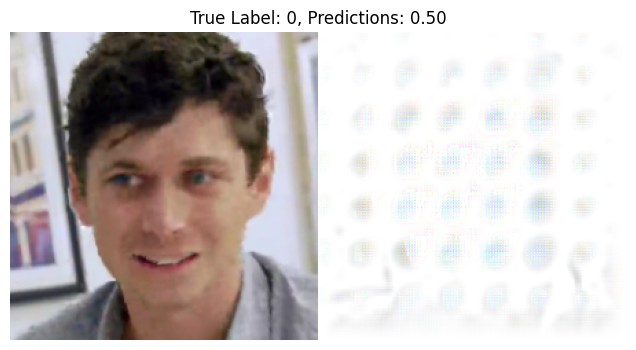

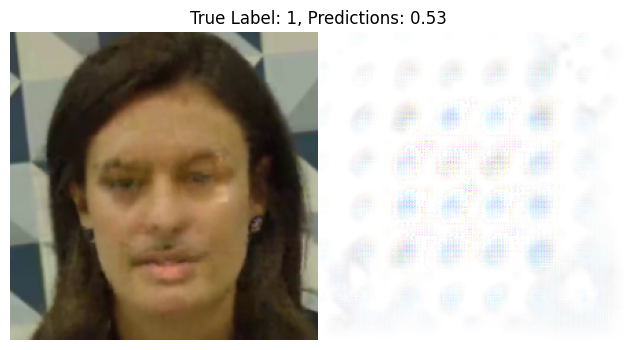

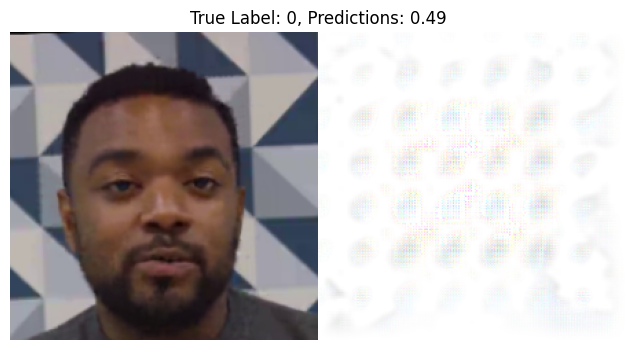

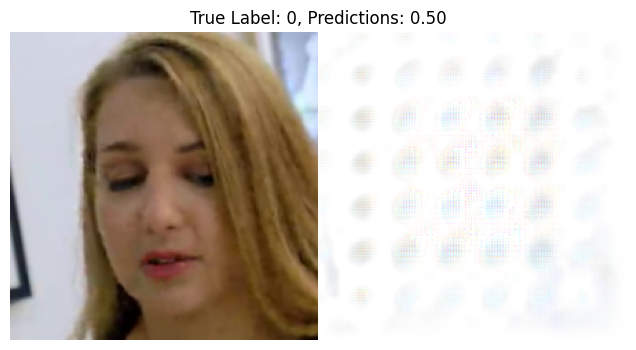

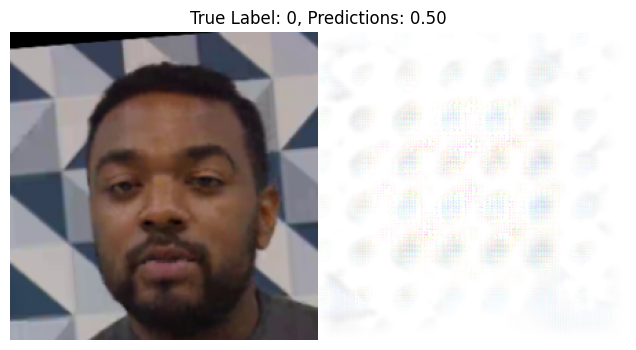

b_cos_model_1732302576.10.pth
C:/Users/KAI/b_cos_model_1732302576.10.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


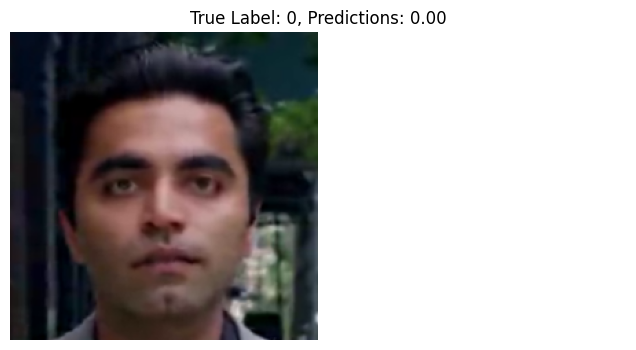

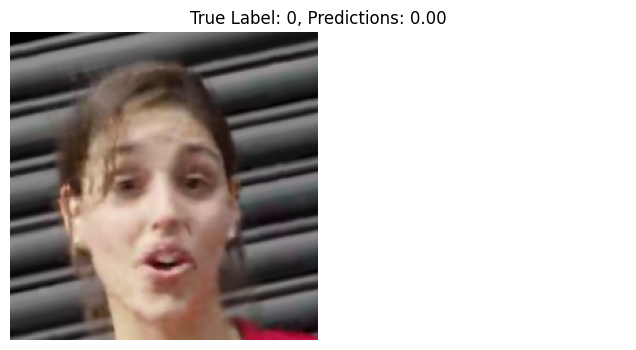

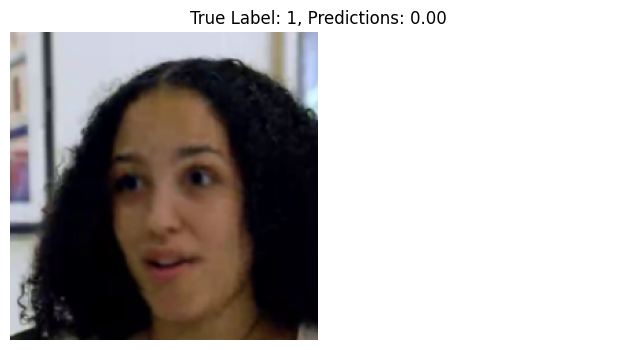

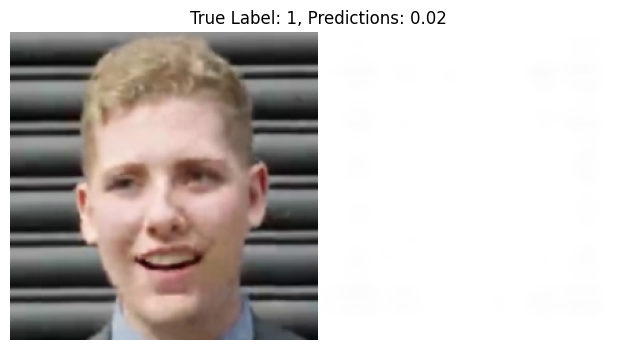

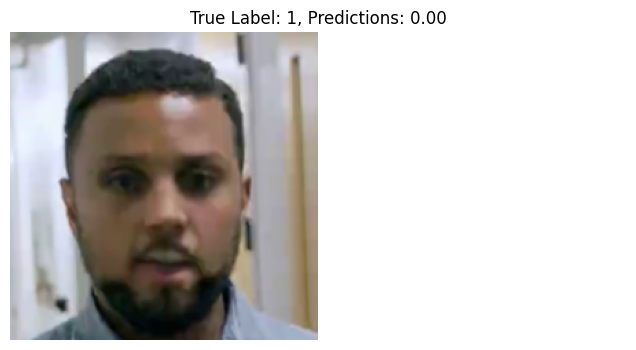

b_cos_model_1732303731.35.pth
C:/Users/KAI/b_cos_model_1732303731.35.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


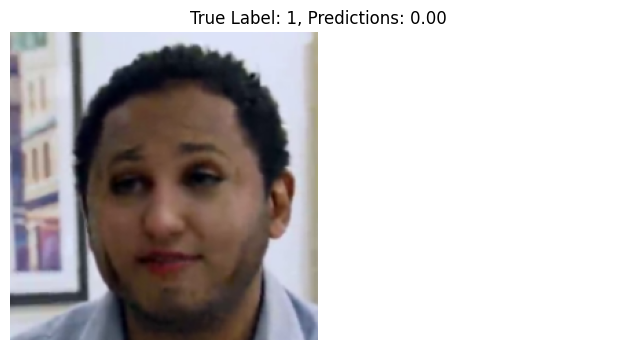

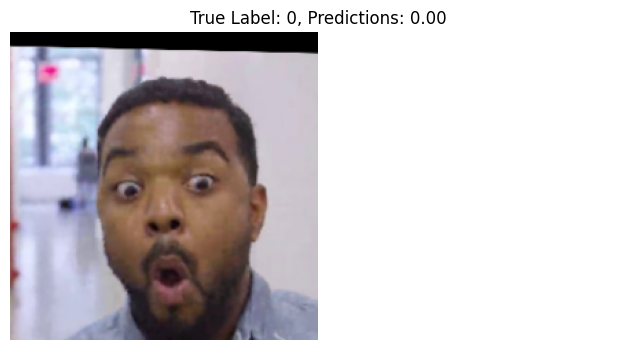

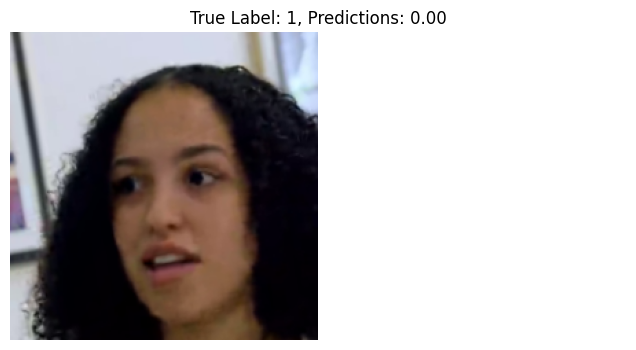

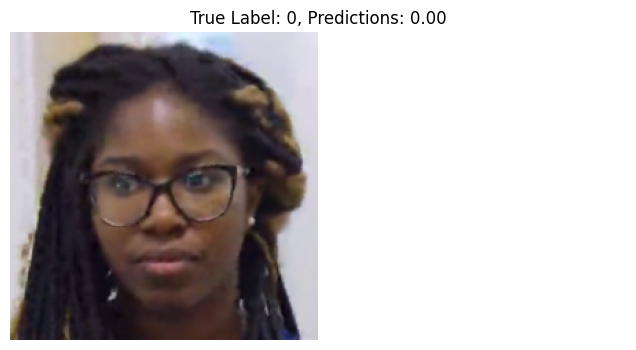

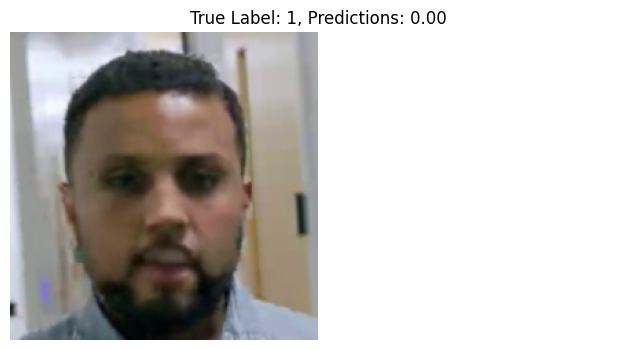

b_cos_model_1732304874.21.pth
C:/Users/KAI/b_cos_model_1732304874.21.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


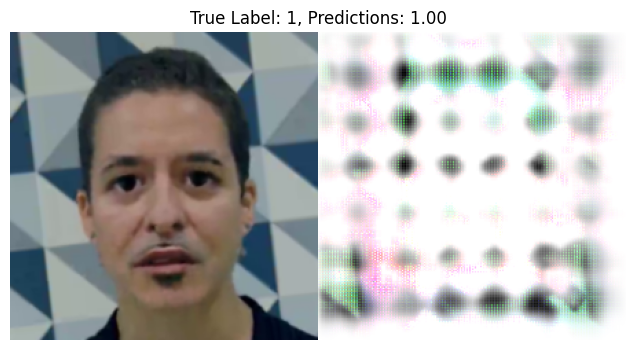

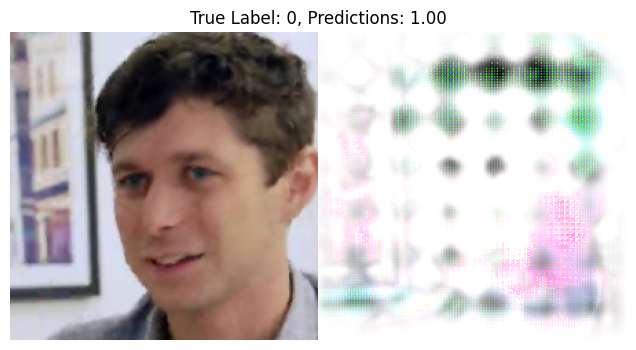

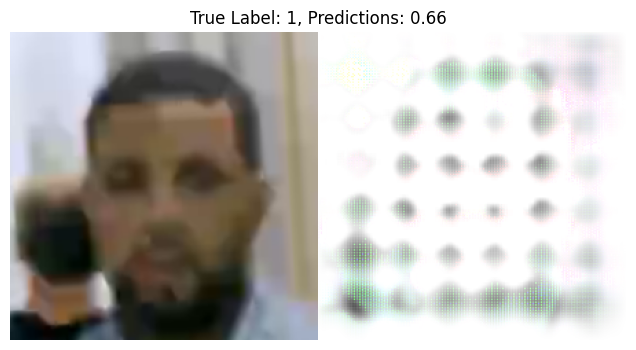

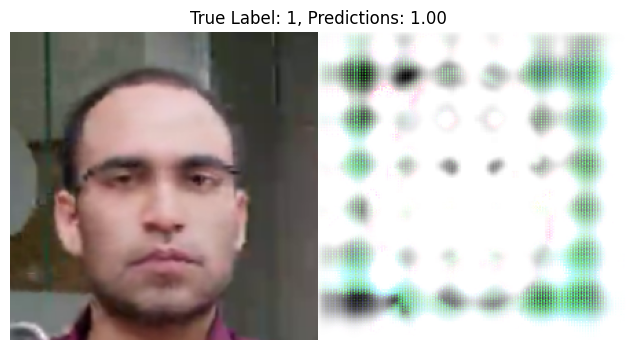

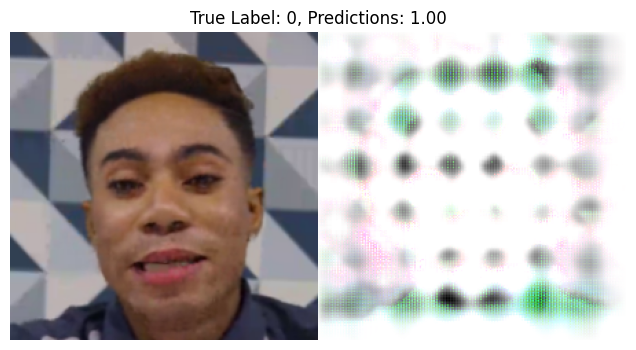

b_cos_model_1732522817.19.pth
C:/Users/KAI/b_cos_model_1732522817.19.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


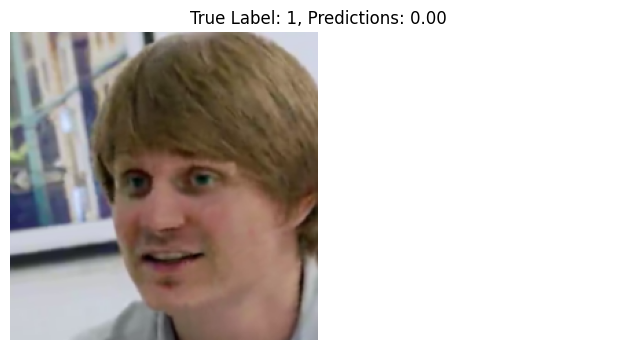

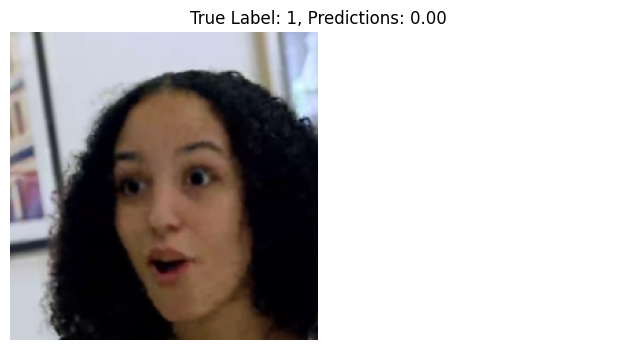

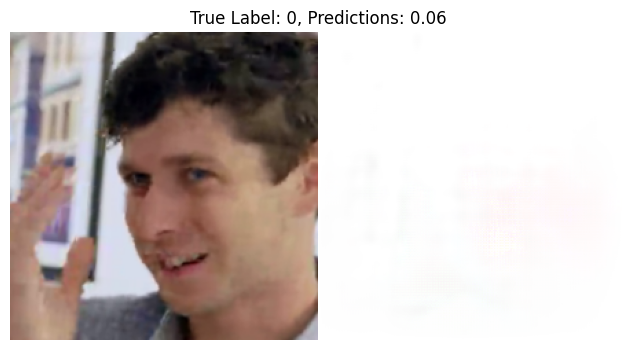

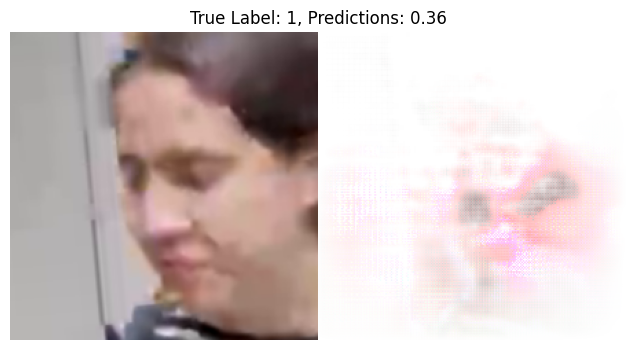

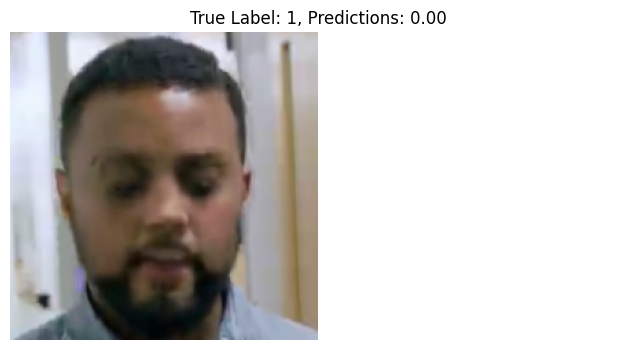

b_cos_model_1732562750.40.pth
C:/Users/KAI/b_cos_model_1732562750.40.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


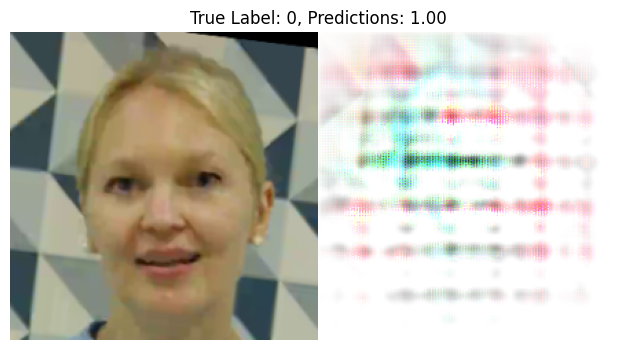

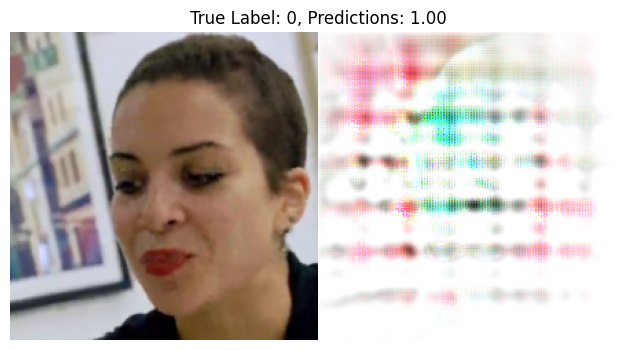

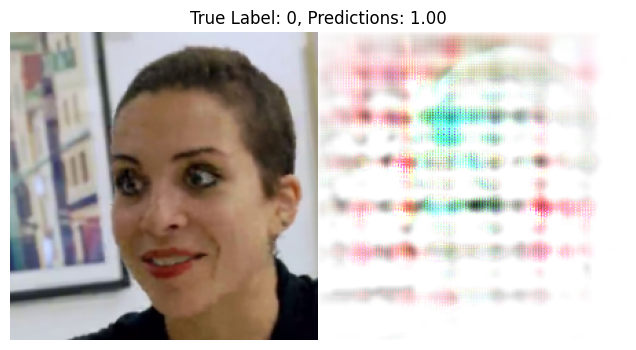

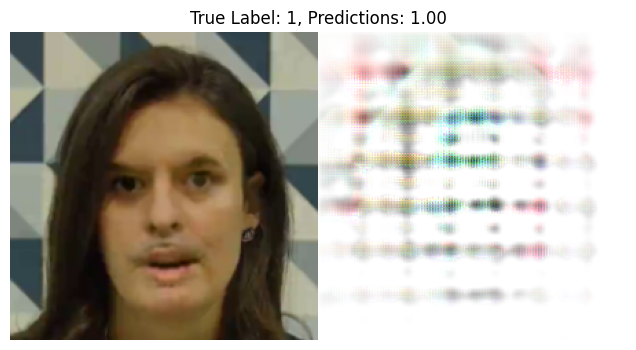

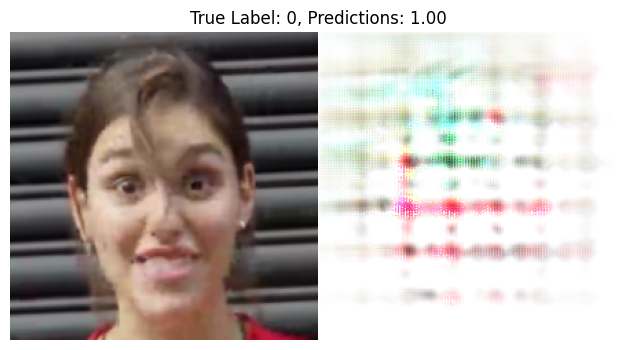

b_cos_model_1732564518.18.pth
C:/Users/KAI/b_cos_model_1732564518.18.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


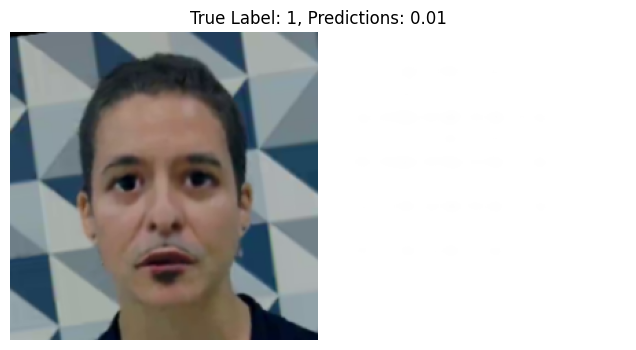

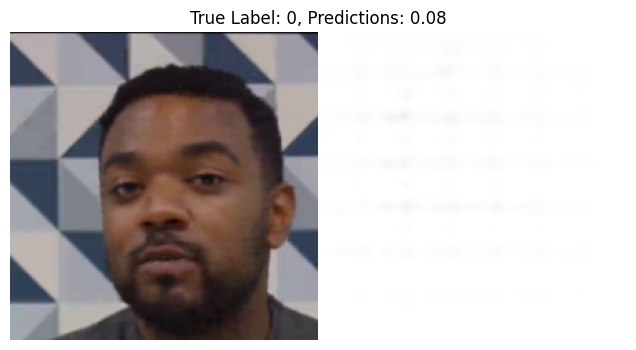

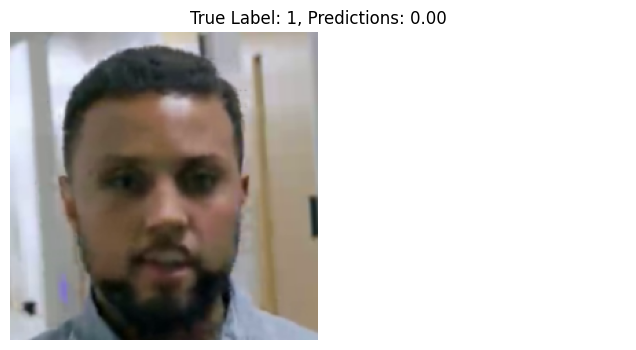

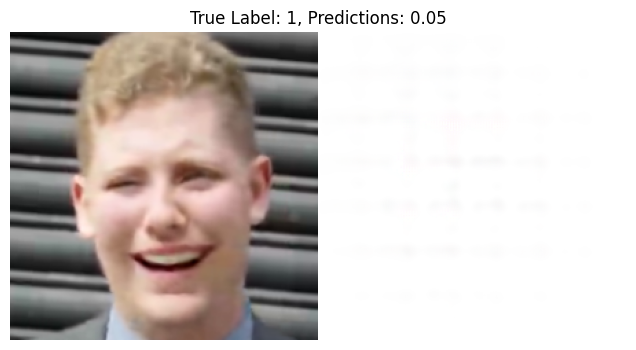

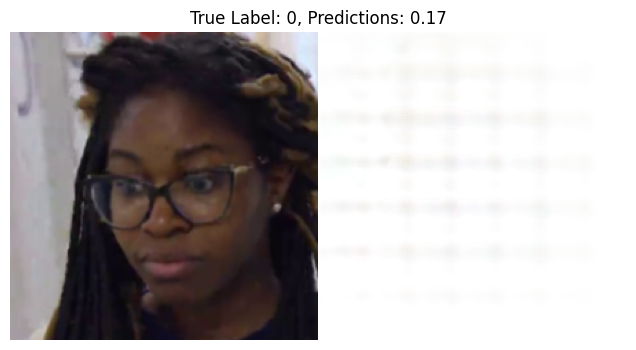

b_cos_model_1732566203.01.pth
C:/Users/KAI/b_cos_model_1732566203.01.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


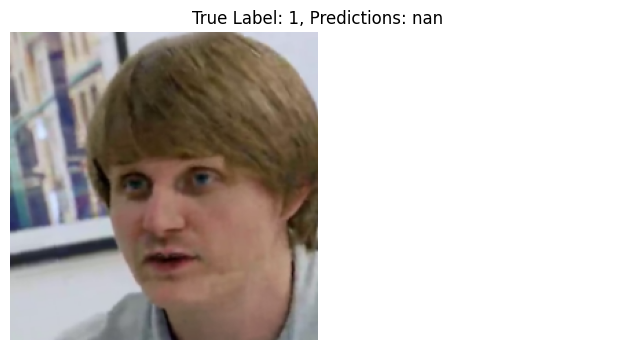

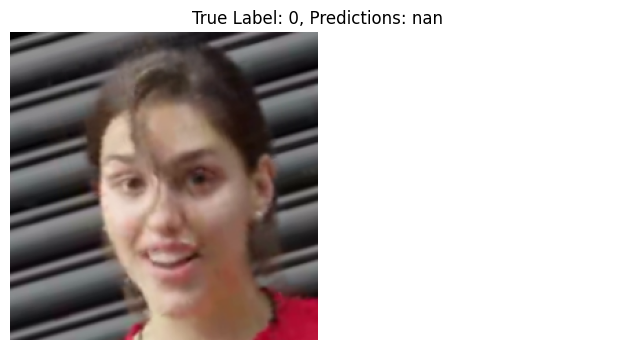

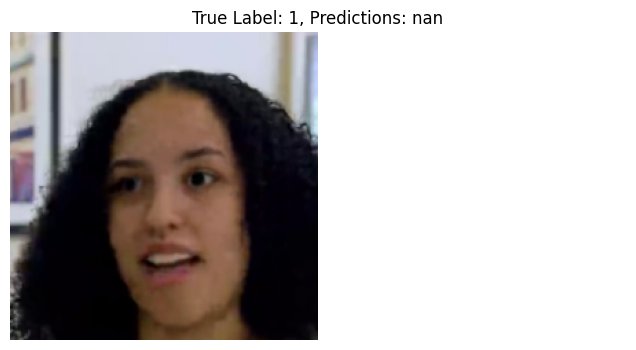

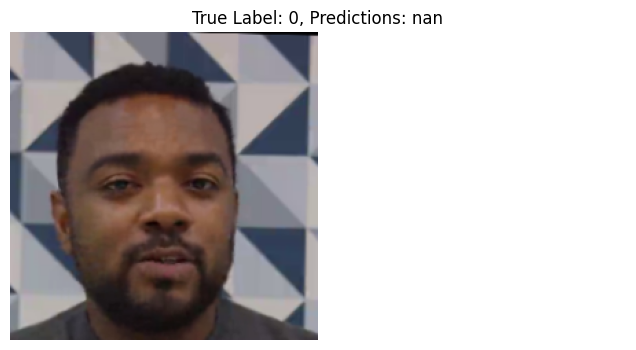

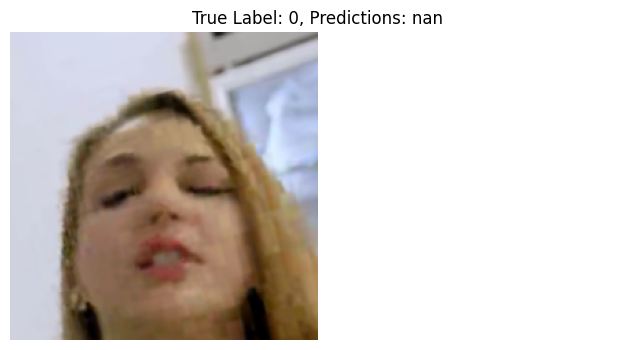

b_cos_model_1732591031.56.pth
C:/Users/KAI/b_cos_model_1732591031.56.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


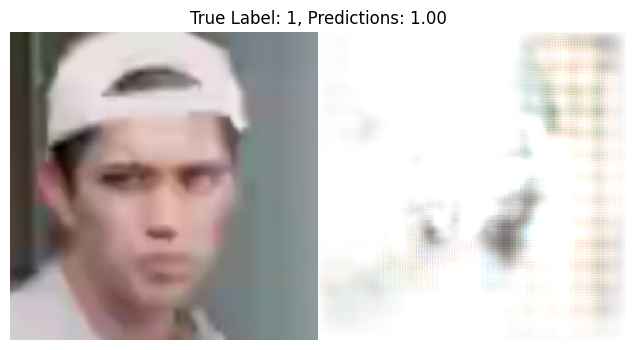

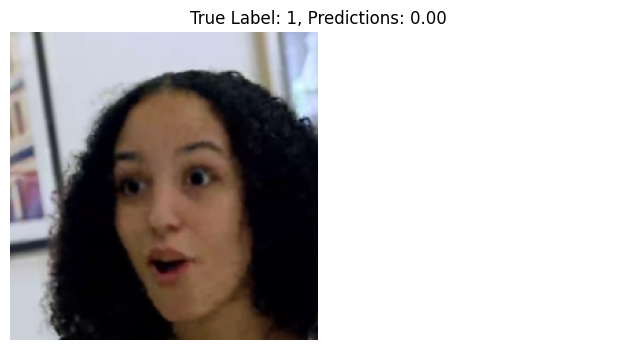

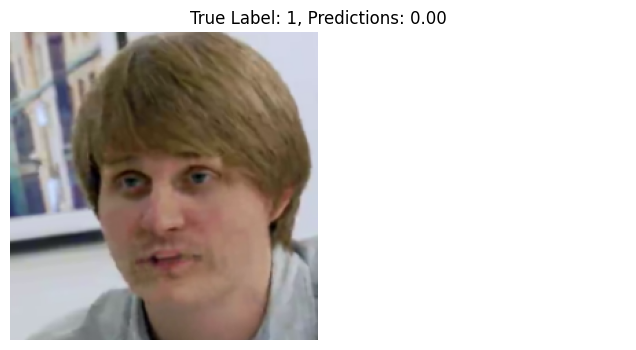

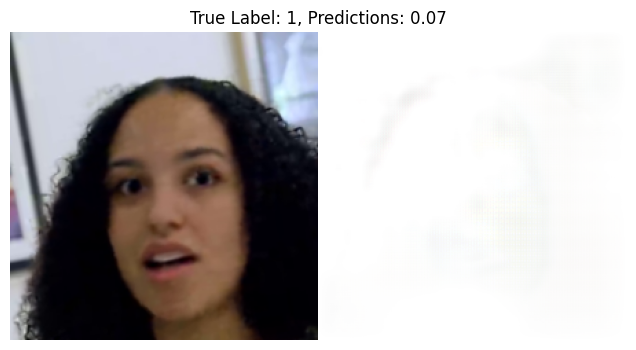

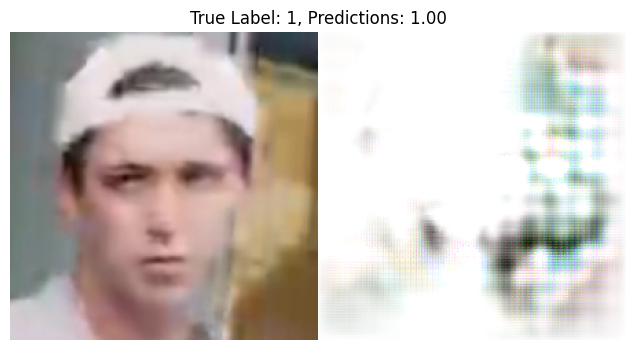

b_cos_model_1732592901.95.pth
C:/Users/KAI/b_cos_model_1732592901.95.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


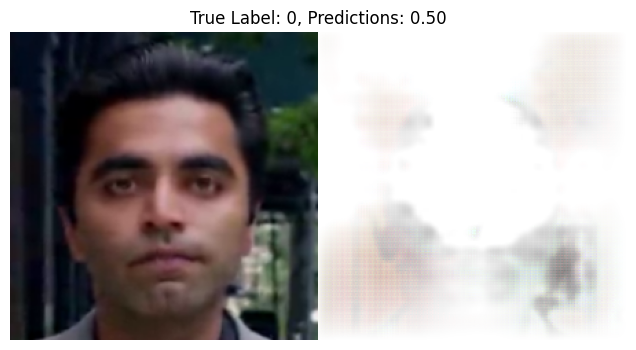

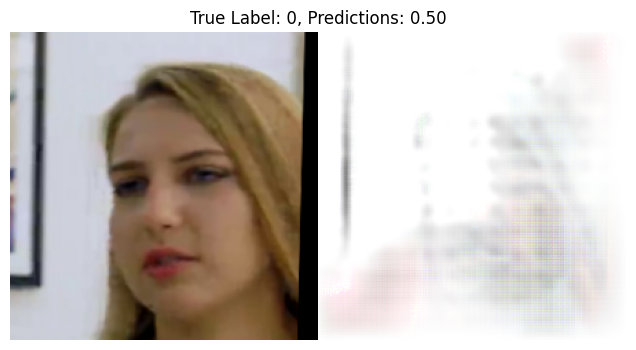

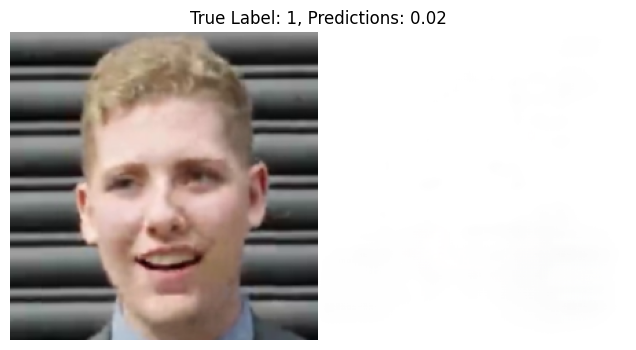

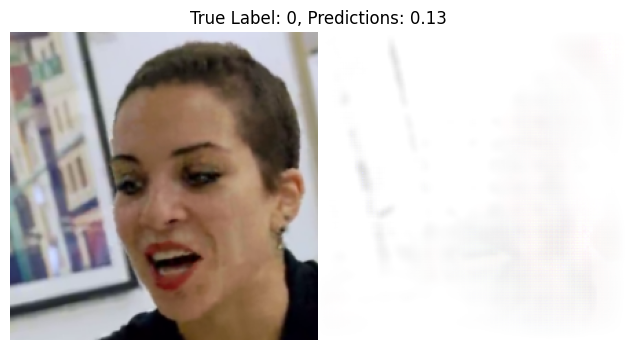

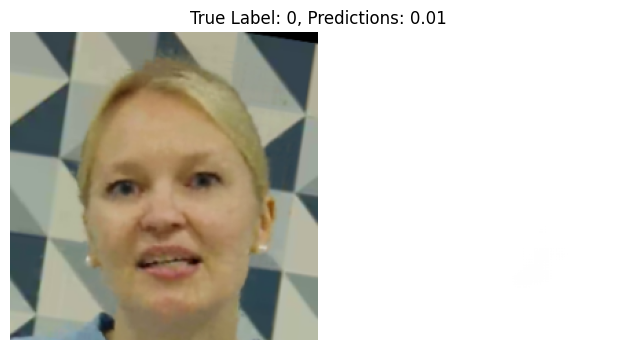

b_cos_model_1732594597.04.pth
C:/Users/KAI/b_cos_model_1732594597.04.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


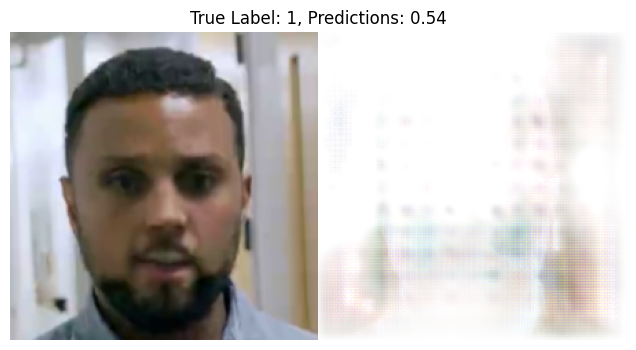

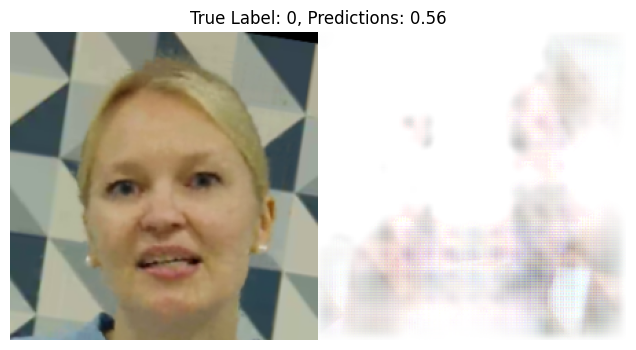

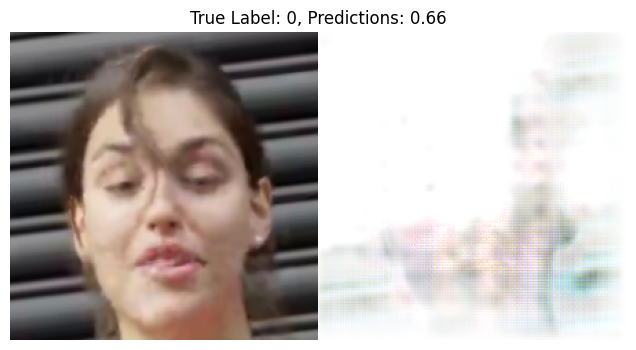

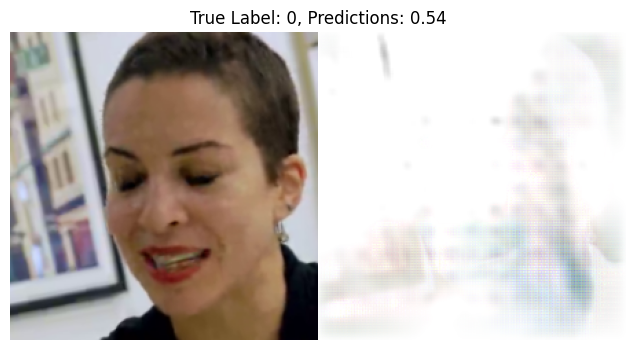

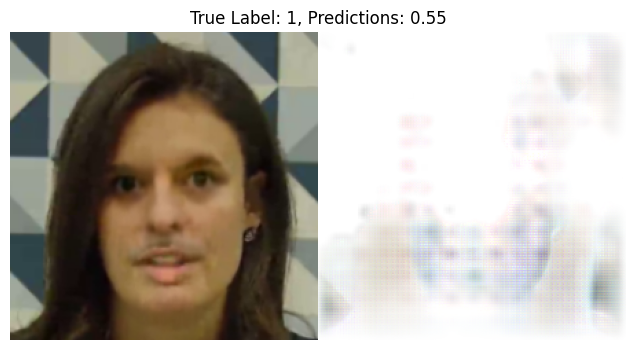

b_cos_model_x.pth
C:/Users/KAI/b_cos_model_x.pth
Batch of images shape: torch.Size([32, 6, 224, 224])


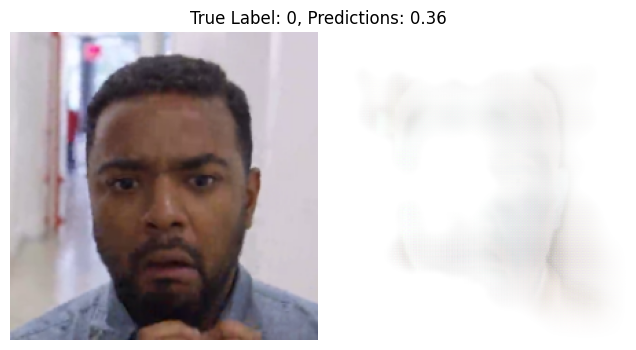

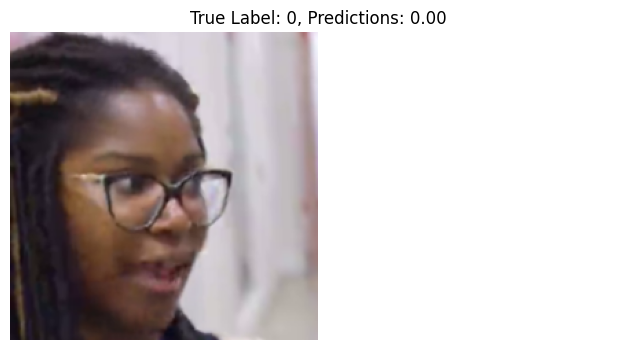

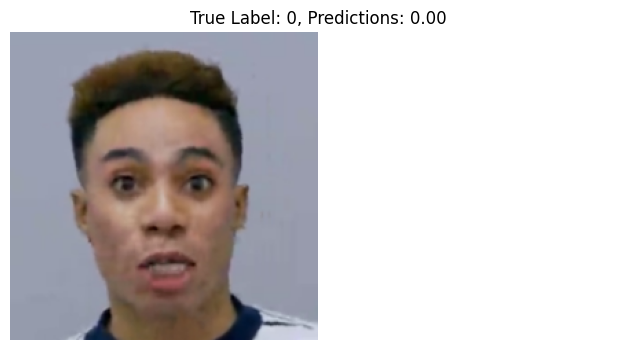

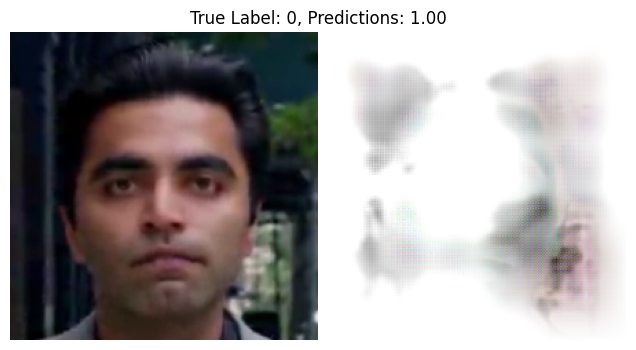

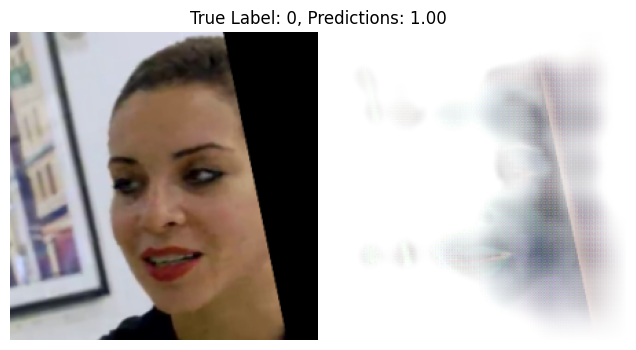

In [27]:
directory = "C:/Users/KAI/"#Coding/Interpretable-Deep-Fake-Detection/weights/B_cos/ResNet50/"
files = [f for f in os.listdir(directory) if f.endswith('.pth')]
for state_dict in files[:]:
    try:
        print(state_dict)
        model = resnet50(pretrained=False, progress=True, num_classes=1, groups=32, width_per_group=4)
        print(directory  + state_dict)
        state_dict = torch.load(directory + state_dict)
        model.load_state_dict(state_dict)
        # Set device to GPU if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model.to(device)

        # Set model to evaluation mode
        # model.eval()

        for img_batch, label_batch in dataloader:
            print(f"Batch of images shape: {img_batch.shape}")

            num_images = min(len(img_batch), 5)
    
            # Iterate through the first 5 images in the batch
            for i in range(num_images):
            # # Iterate through each image in the batch
            # for i in range(len(img_batch)):
                img = img_batch[i].unsqueeze(0).to(device)  # Process a single image
                label = label_batch[i]

                img = img.requires_grad_(True)

                # Zero the gradients
                model.zero_grad()

                # Forward pass
                out = model(img)

                # Backward pass
                out.backward()

                # Generate attention visualization
                att = grad_to_img(img[0], img.grad[0], alpha_percentile=100, smooth=5)
                att[..., -1] *= to_numpy(out.sigmoid())

                # Prepare the image and attention map for visualization
                att = to_numpy(att)
                img_np = np.array(to_numpy(img[0, :3].permute(1, 2, 0)) * 255, dtype=np.uint8)

                # Plot the results
                fig, ax = plt.subplots(1, figsize=(8, 4))
                plt.imshow(img_np, extent=(0, 224, 0, 224))
                plt.imshow(att, extent=(224, 2 * 224, 0, 224))
                plt.xlim(0, 2 * 224)
                plt.xticks([])
                plt.yticks([])
                plt.title(f"True Label: {label}, Predictions: {out.sigmoid().item():.2f}")
                for spine in ax.spines.values():
                    spine.set_visible(False)
                plt.show()
            break  # Exit after processing the first batch
    except Exception as e:
        print(e)
        continue

## old

In [ ]:
def load_pretrained_weights(model, model_url):
    # Load the state dict from the URL
    state_dict = load_state_dict_from_url(model_url, progress=True)

    # Rename keys to match custom model layer names and initialize adapted state dict
    adapted_state_dict = {}
    for key, value in state_dict.items():
        # Replace ".weight" with ".linear.weight" if necessary for `BcosConv2d`
        new_key = key.replace("conv", "conv.linear").replace("fc", "fc.linear")
        
        # Only add weights if the shape matches the model's layer
        if new_key in model.state_dict() and model.state_dict()[new_key].shape == value.shape:
            adapted_state_dict[new_key] = value

    # Load the adapted state dict with partial loading (non-strict mode)
    model.load_state_dict(adapted_state_dict, strict=False)

    # Reinitialize the final layer to match the desired output shape (for 2 classes)
    nn.init.kaiming_normal_(model.fc.linear.weight)
    if model.fc.linear.bias is not None:
        model.fc.linear.bias.data.zero_()  # Initialize bias to zero if it exists

# Usage with resnet50
model = resnet50(pretrained=False, progress=True, num_classes=1, groups=32, width_per_group=4)
load_pretrained_weights(model, 'https://download.pytorch.org/models/resnet50-19c8e357.pth')

In [43]:
# Set device to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss() #nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 1
fraction = 1
num_batches = int(len(dataloader) * fraction)

# Training loop with limited batches
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(dataloader, total=num_batches, desc=f'Epoch [{epoch + 1}/{num_epochs}]')
    for batch_idx, (images, labels) in enumerate(progress_bar):
        if batch_idx >= num_batches:
            break  # Stop after reaching the fraction of batches

        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)

        # outputs = outputs.view(outputs.size(0), -1) NEEDED WHEN USING CROSS ENTROPY LOSS & num_classes > 1

        # Convert labels to float for BCEWithLogitsLoss
        labels = labels.float()
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        progress_bar.set_postfix({'Loss': running_loss / (batch_idx + 1)})
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / num_batches:.4f}')

Epoch [1/1]: 100%|██████████| 20/20 [12:31<00:00, 37.56s/it, Loss=0.76] 

Epoch [1/1], Loss: 0.7602


In [15]:
torch.save(model.state_dict(), 'b_cos_model_2.pth')

In [5]:
model_trained = resnet50(pretrained=False, progress=True, num_classes=1, groups=32, width_per_group=4)

model_trained.load_state_dict(torch.load('b_cos_model_x.pth', map_location=torch.device('cpu')))

<All keys matched successfully>